##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Convolutional Variational Autoencoder

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/generative/cvae">
    <img src="https://www.tensorflow.org/images/tf_logo_32px.png" />
    View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />
    Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/cvae.ipynb">
    <img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />
    View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/generative/cvae.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

This notebook demonstrates how to train a Variational Autoencoder (VAE) ([1](https://arxiv.org/abs/1312.6114), [2](https://arxiv.org/abs/1401.4082)) on the MNIST dataset. A VAE is a probabilistic take on the autoencoder, a model which takes high dimensional input data and compresses it into a smaller representation. Unlike a traditional autoencoder, which maps the input onto a latent vector, a VAE maps the input data into the parameters of a probability distribution, such as the mean and variance of a Gaussian. This approach produces a continuous, structured latent space, which is useful for image generation.

![CVAE image latent space](images/cvae_latent_space.jpg)

## Setup

In [ ]:
!pip install tensorflow-probability

# to generate gifs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-t2taexcm
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-t2taexcm
  Resolved https://github.com/tensorflow/docs to commit de223126b8f1c5365f935e687b56518cf256b4b6
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2025.3.6.10029-py3-none-any.whl size=186351 sha256=91181280dbb6b5cb1a57c0dd0127fb5cde74a8c26710f79bd9dae455e2b62697
  Stored in directory: /tmp/pip-ephem-wheel-cache-dbl68orr/wheels/34/53/89/3db54cf97ce0f0261aaab3fdc12a847ea0879d34edf373e2c5
Successfully built tensorflow-docs


In [ ]:
from IPython import display

import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
import tensorflow_probability as tfp
import time

## Load the fashion dataset


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

# Parameters
data_path = "/content/drive/MyDrive/Colab Notebooks/tfg/fashion_images/fashion_images_converted/"
IMG_SIZE = 64
BATCH_SIZE = 128
VAL_SPLIT = 0.2
SEED = 42

# Load training dataset (no labels)
train_dataset = tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    validation_split=VAL_SPLIT,
    subset="training"
)

# Load validation dataset
val_dataset = tf.keras.utils.image_dataset_from_directory(
    data_path,
    label_mode=None,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=SEED,
    validation_split=VAL_SPLIT,
    subset="validation"
)

# Define data augmentation pipeline
data_augmentation = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.0417),  # ~15 degrees
    layers.RandomTranslation(0.05, 0.05),
    layers.RandomContrast(0.2),
    layers.Lambda(lambda x: tf.image.random_brightness(x, max_delta=0.2)),
    layers.Lambda(lambda x: tf.image.random_saturation(x, lower=0.8, upper=1.2)),
    layers.Rescaling(1./127.5, offset=-1),  # Normalize to [-1, 1]
])

# For test set: only resize and normalize
preprocess = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.Rescaling(1./127.5, offset=-1),
])

# Apply transformations
# train_dataset = train_dataset.map(lambda x: data_augmentation(x)).cache().shuffle(1000).prefetch(tf.data.AUTOTUNE)
train_dataset = train_dataset.map(lambda x: preprocess(x)).cache().prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.map(lambda x: preprocess(x)).cache().prefetch(tf.data.AUTOTUNE)


Found 1843 files.
Using 1475 files for training.
Found 1843 files.
Using 368 files for validation.


## Define the encoder and decoder networks with *tf.keras.Sequential*

In this VAE example, use two small ConvNets for the encoder and decoder networks. In the literature, these networks are also referred to as inference/recognition and generative models respectively. Use `tf.keras.Sequential` to simplify implementation. Let $x$ and $z$ denote the observation and latent variable respectively in the following descriptions.

### Encoder network
This defines the approximate posterior distribution $q(z|x)$, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation $z$.
In this example, simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian.
Output log-variance instead of the variance directly for numerical stability.

### Decoder network
This defines the conditional distribution of the observation $p(x|z)$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation.
Model the latent distribution prior $p(z)$ as a unit Gaussian.

### Reparameterization trick
To generate a sample $z$ for the decoder during training, you can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $x$.
However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, use a reparameterization trick.
In our example, you approximate $z$ using the decoder parameters and another parameter $\epsilon$ as follows:

$$z = \mu + \sigma \odot \epsilon$$

where $\mu$ and $\sigma$ represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The $\epsilon$ can be thought of as a random noise used to maintain stochasticity of $z$. Generate $\epsilon$ from a standard normal distribution.

The latent variable $z$ is now generated by a function of $\mu$, $\sigma$ and $\epsilon$, which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

### Network architecture
For the encoder network, use two convolutional layers followed by a fully-connected layer. In the decoder network, mirror this architecture by using a fully-connected layer followed by three convolution transpose layers (a.k.a. deconvolutional layers in some contexts). Note, it's common practice to avoid using batch normalization when training VAEs, since the additional stochasticity due to using mini-batches may aggravate instability on top of the stochasticity from sampling.


In [ ]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim

    self.encoder = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(IMG_SIZE, IMG_SIZE, 3)),

        tf.keras.layers.Conv2D(32, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(64, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(128, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(latent_dim + latent_dim),  # outputs [mean, logvar]
    ])

    self.decoder = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(latent_dim,)),

        tf.keras.layers.Dense(8 * 8 * 128, activation='relu'),  # Adjusted dense layer output
        tf.keras.layers.Reshape((8, 8, 128)),

        tf.keras.layers.Conv2DTranspose(128, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2DTranspose(32, 3, strides=2, padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.ReLU(),

        tf.keras.layers.Conv2DTranspose(3, 3, strides=1, padding='same', activation='sigmoid'), # Adjusted stride and padding
    ])

  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.decoder(z)
    if apply_sigmoid:
      # The last layer of the decoder now directly outputs probabilities with sigmoid
      return logits
    return logits # Still return logits if apply_sigmoid is False

## Define the loss function and the optimizer

VAEs train by maximizing the evidence lower bound (ELBO) on the marginal log-likelihood:

$$\log p(x) \ge \text{ELBO} = \mathbb{E}_{q(z|x)}\left[\log \frac{p(x, z)}{q(z|x)}\right].$$

In practice, optimize the single sample Monte Carlo estimate of this expectation:

$$\log p(x| z) + \log p(z) - \log q(z|x),$$
where $z$ is sampled from $q(z|x)$.

Note: You could also analytically compute the KL term, but here you incorporate all three terms in the Monte Carlo estimator for simplicity.

In [ ]:
optimizer = tf.keras.optimizers.Adam(1e-4)

def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)

def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  # Ensure shapes are compatible before calculating cross-entropy
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x[:tf.shape(x_logit)[0]])
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)

# Removed @tf.function decorator
def train_step(model, x, optimizer):
  """Executes one training step and returns the loss.

  This function computes the loss and gradients, and uses the latter to
  update the model's parameters.
  """
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

## Training

* Start by iterating over the dataset
* During each iteration, pass the image to the encoder to obtain a set of mean and log-variance parameters of the approximate posterior $q(z|x)$
* then apply the *reparameterization trick* to sample from $q(z|x)$
* Finally, pass the reparameterized samples to the decoder to obtain the logits of the generative distribution $p(x|z)$
* Note: Since you use the dataset loaded by keras with 60k datapoints in the training set and 10k datapoints in the test set, our resulting ELBO on the test set is slightly higher than reported results in the literature which uses dynamic binarization of Larochelle's MNIST.

### Generating images

* After training, it is time to generate some images
* Start by sampling a set of latent vectors from the unit Gaussian prior distribution $p(z)$
* The generator will then convert the latent sample $z$ to logits of the observation, giving a distribution $p(x|z)$
* Here, plot the probabilities of Bernoulli distributions


In [ ]:
epochs = 100
# set the dimensionality of the latent space to a plane for visualization later
latent_dim = 2
num_examples_to_generate = 16

# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [ ]:
def generate_and_save_images(model, epoch, test_sample):
  mean, logvar = model.encode(test_sample)
  z = model.reparameterize(mean, logvar)
  predictions = model.sample(z)
  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)

        image = predictions[i]
        image = image.numpy()  # Asegúrate de que sea un array de NumPy si es tensor

        if image.shape[-1] == 1:  # escala de grises
            plt.imshow(image[:, :, 0], cmap='gray')
        else:  # RGB
            plt.imshow(image)  # matplotlib acepta RGB en [0,1]

        plt.axis('off')

  plt.tight_layout()
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
# Set how many samples you want to generate from test data
num_examples_to_generate = 16  # for example
batch_size = BATCH_SIZE        # must match your dataset's BATCH_SIZE

assert batch_size >= num_examples_to_generate

# Pick a batch from test set
for test_batch in val_dataset.take(1):  # 'val_dataset' is your test set
    test_sample = test_batch[:num_examples_to_generate]  # shape: (num_examples, 64, 64, 3)


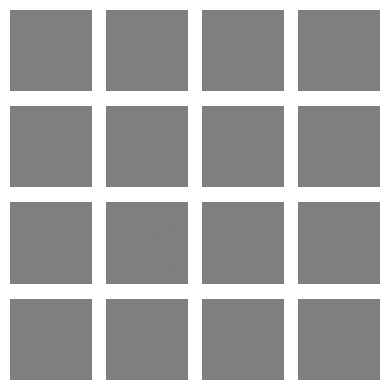

Epoch: 1, Test set ELBO: -8710.7626953125, time elapse for current epoch: 81.93187975883484


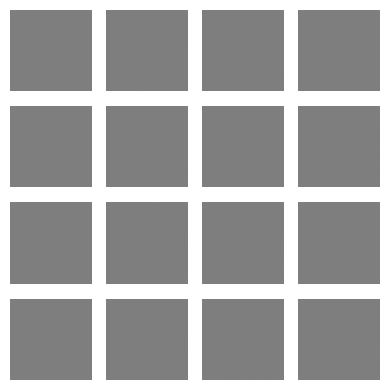

Epoch: 2, Test set ELBO: -8702.0634765625, time elapse for current epoch: 40.955082654953


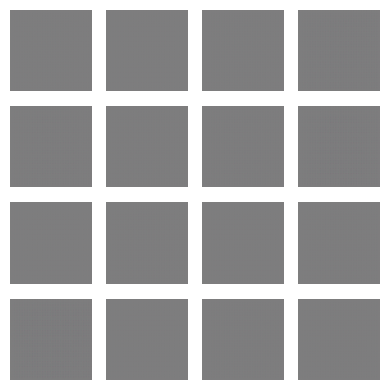

Epoch: 3, Test set ELBO: -8644.1318359375, time elapse for current epoch: 34.71962356567383


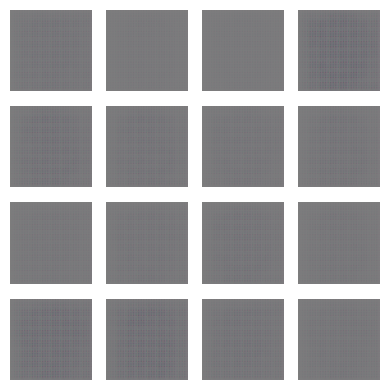

Epoch: 4, Test set ELBO: -8385.76171875, time elapse for current epoch: 40.943764209747314


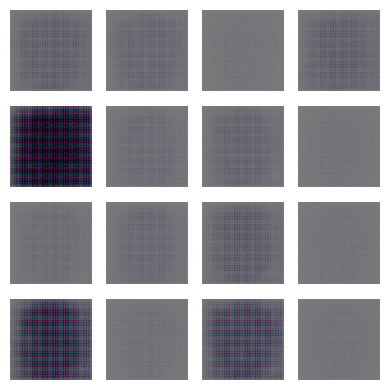

Epoch: 5, Test set ELBO: -8112.03271484375, time elapse for current epoch: 29.828386545181274


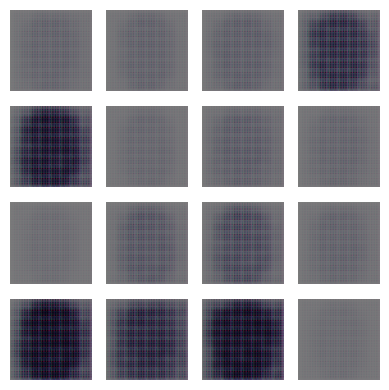

Epoch: 6, Test set ELBO: -7906.97119140625, time elapse for current epoch: 34.542375564575195


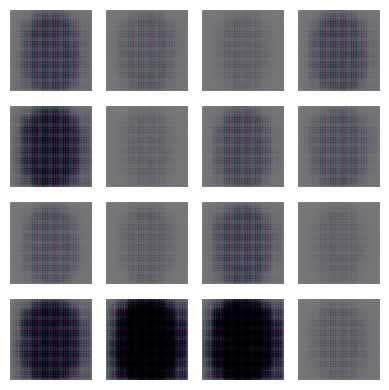

Epoch: 7, Test set ELBO: -7751.92431640625, time elapse for current epoch: 30.309133052825928


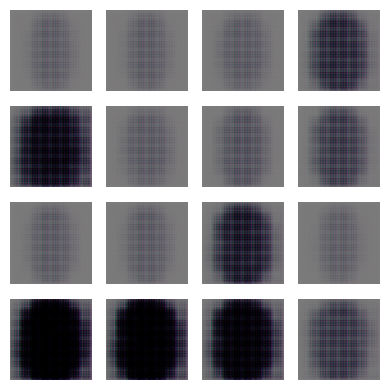

Epoch: 8, Test set ELBO: -7614.18359375, time elapse for current epoch: 30.51875615119934


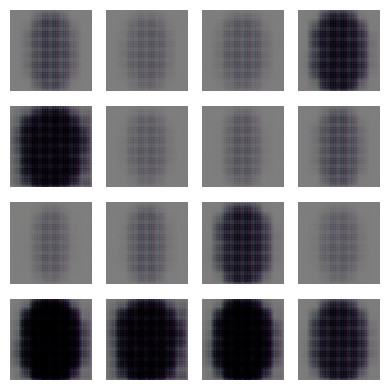

Epoch: 9, Test set ELBO: -7529.57080078125, time elapse for current epoch: 30.07767391204834


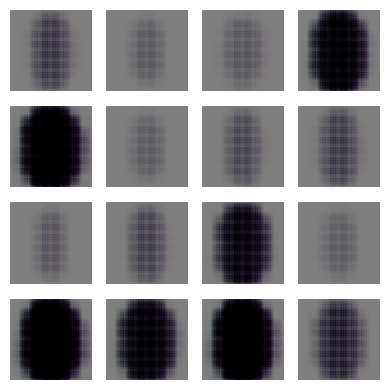

Epoch: 10, Test set ELBO: -7481.83837890625, time elapse for current epoch: 30.301974296569824


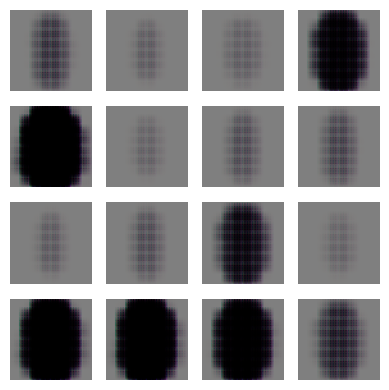

Epoch: 11, Test set ELBO: -7456.42431640625, time elapse for current epoch: 40.947412729263306


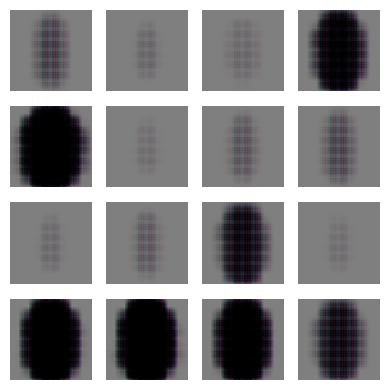

Epoch: 12, Test set ELBO: -7429.505859375, time elapse for current epoch: 40.94667172431946


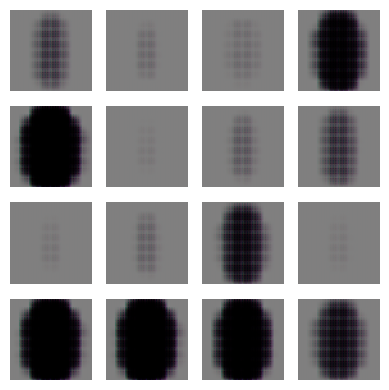

Epoch: 13, Test set ELBO: -7407.05224609375, time elapse for current epoch: 30.48531174659729


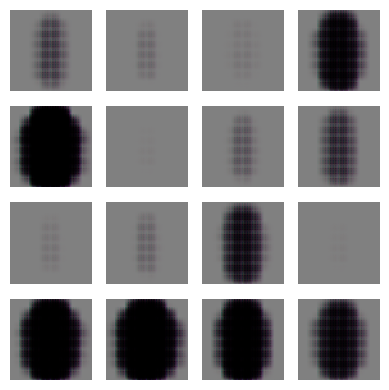

Epoch: 14, Test set ELBO: -7383.5546875, time elapse for current epoch: 40.94670653343201


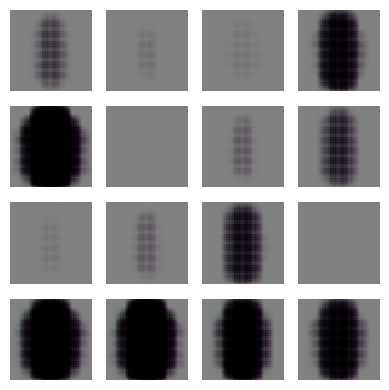

Epoch: 15, Test set ELBO: -7354.74853515625, time elapse for current epoch: 40.94428730010986


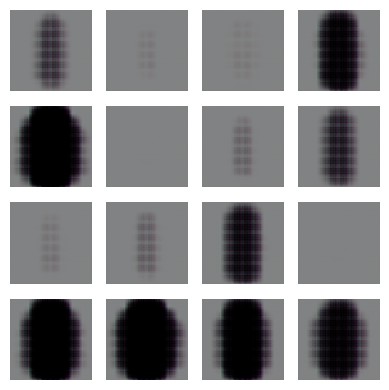

Epoch: 16, Test set ELBO: -7317.68212890625, time elapse for current epoch: 30.65460968017578


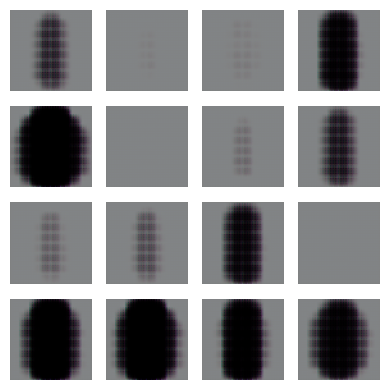

Epoch: 17, Test set ELBO: -7280.60595703125, time elapse for current epoch: 30.63853693008423


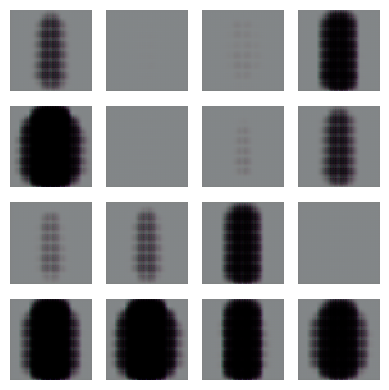

Epoch: 18, Test set ELBO: -7243.56005859375, time elapse for current epoch: 30.587170362472534


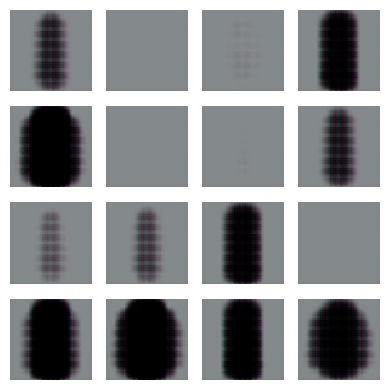

Epoch: 19, Test set ELBO: -7204.7734375, time elapse for current epoch: 30.42578411102295


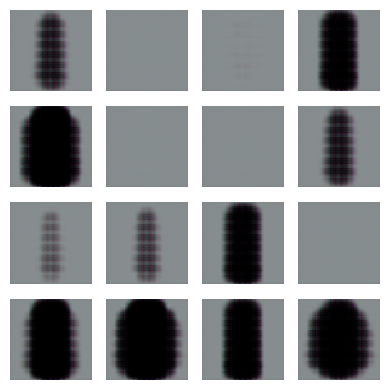

Epoch: 20, Test set ELBO: -7161.869140625, time elapse for current epoch: 32.38922739028931


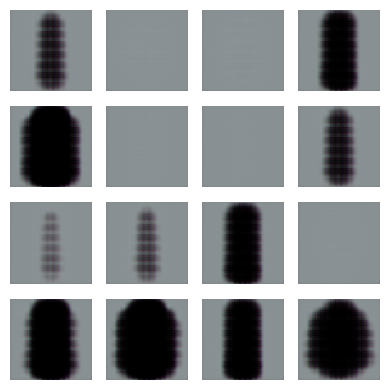

Epoch: 21, Test set ELBO: -7112.603515625, time elapse for current epoch: 30.458667755126953


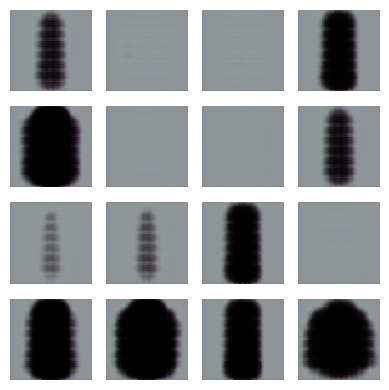

Epoch: 22, Test set ELBO: -7054.71826171875, time elapse for current epoch: 40.9434757232666


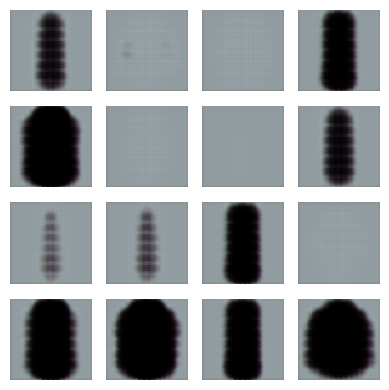

Epoch: 23, Test set ELBO: -6986.126953125, time elapse for current epoch: 30.179307222366333


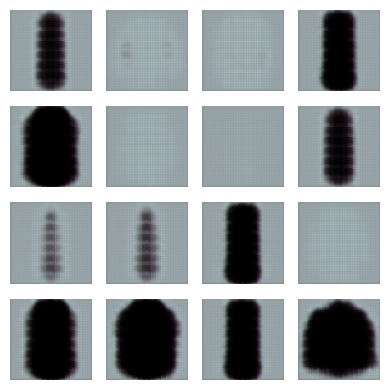

Epoch: 24, Test set ELBO: -6900.89111328125, time elapse for current epoch: 31.04503583908081


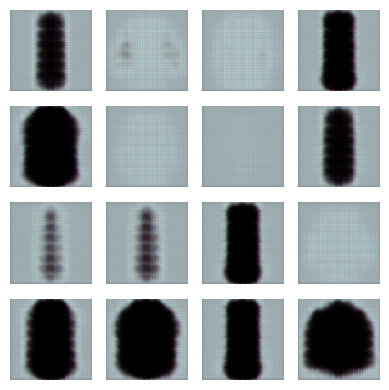

Epoch: 25, Test set ELBO: -6790.46533203125, time elapse for current epoch: 31.680803298950195


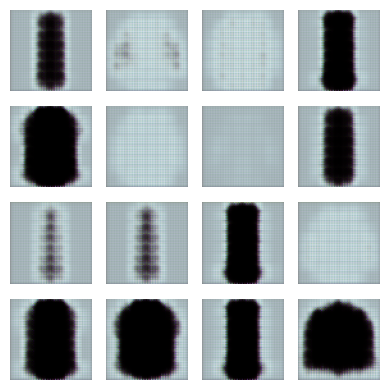

Epoch: 26, Test set ELBO: -6657.60791015625, time elapse for current epoch: 31.16442108154297


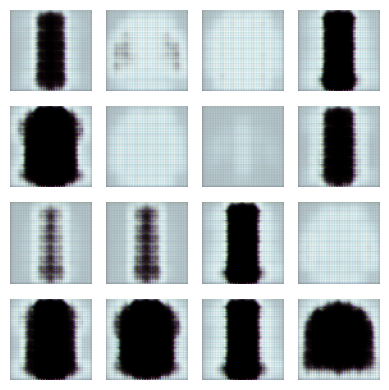

Epoch: 27, Test set ELBO: -6518.24658203125, time elapse for current epoch: 30.286863565444946


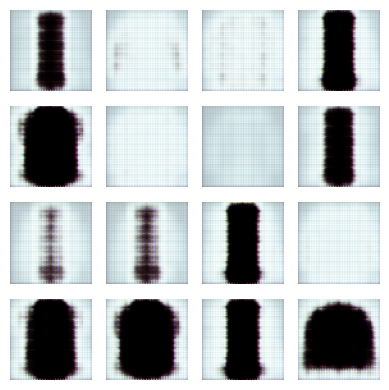

Epoch: 28, Test set ELBO: -6439.49853515625, time elapse for current epoch: 30.30020761489868


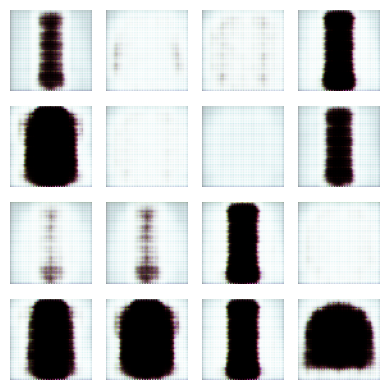

Epoch: 29, Test set ELBO: -6382.95166015625, time elapse for current epoch: 40.95261240005493


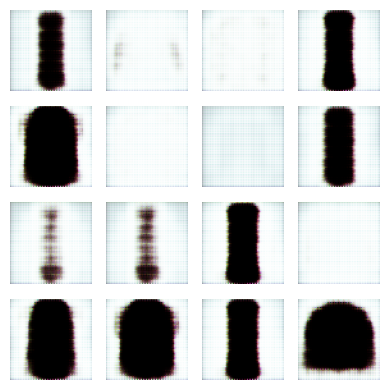

Epoch: 30, Test set ELBO: -6349.12890625, time elapse for current epoch: 30.46915912628174


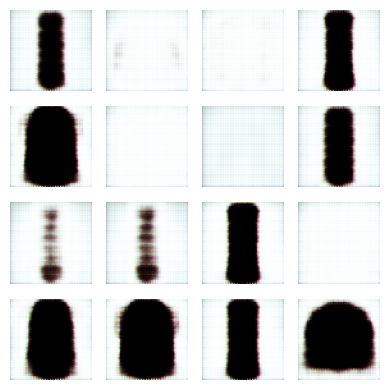

Epoch: 31, Test set ELBO: -6334.80224609375, time elapse for current epoch: 40.95369338989258


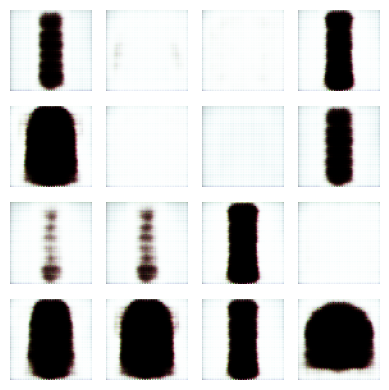

Epoch: 32, Test set ELBO: -6315.12890625, time elapse for current epoch: 30.412189483642578


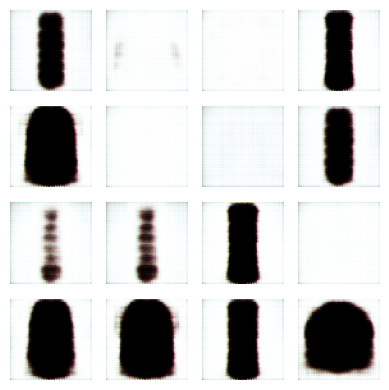

Epoch: 33, Test set ELBO: -6299.44677734375, time elapse for current epoch: 30.355311155319214


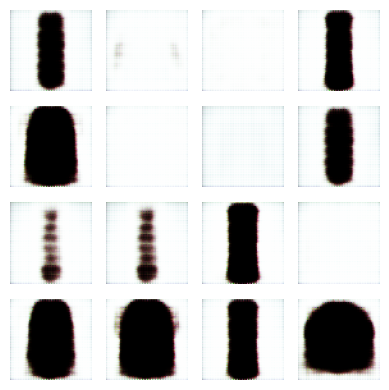

Epoch: 34, Test set ELBO: -6294.07421875, time elapse for current epoch: 32.72406888008118


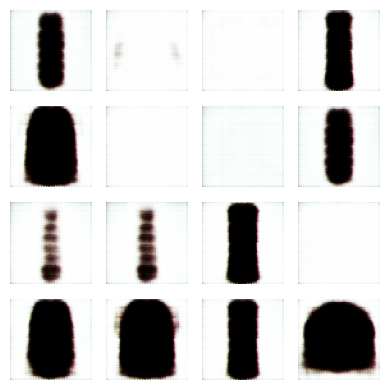

Epoch: 35, Test set ELBO: -6283.8671875, time elapse for current epoch: 30.192775011062622


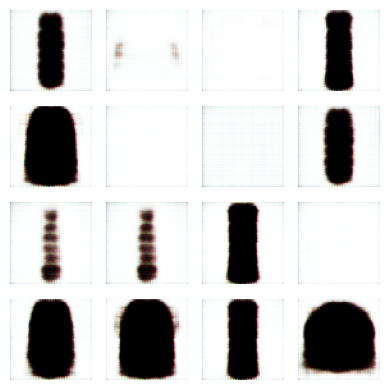

Epoch: 36, Test set ELBO: -6276.919921875, time elapse for current epoch: 30.290468454360962


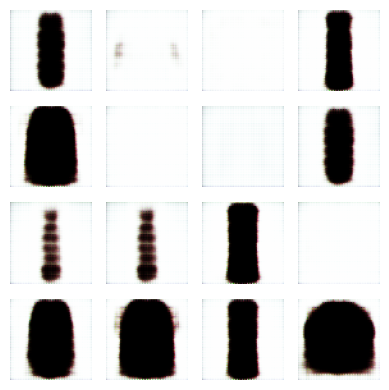

Epoch: 37, Test set ELBO: -6271.74853515625, time elapse for current epoch: 30.558563232421875


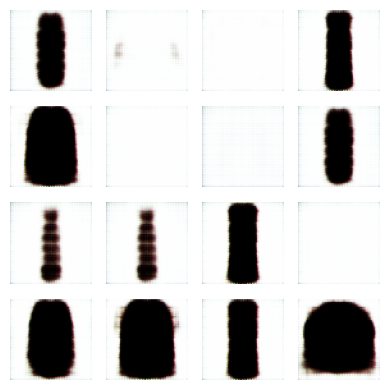

Epoch: 38, Test set ELBO: -6266.26708984375, time elapse for current epoch: 30.318359375


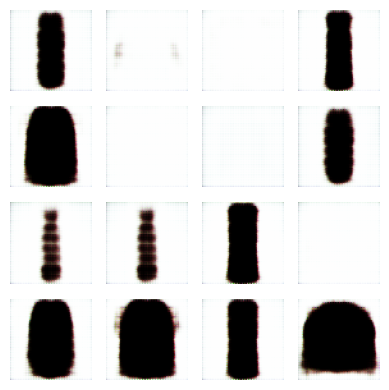

Epoch: 39, Test set ELBO: -6262.25537109375, time elapse for current epoch: 40.951460123062134


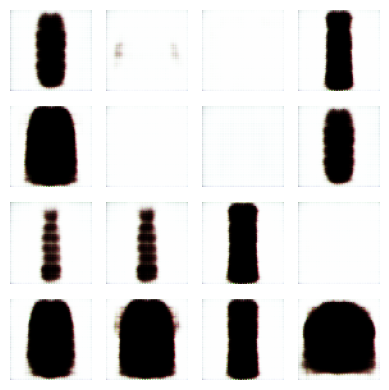

Epoch: 40, Test set ELBO: -6258.34716796875, time elapse for current epoch: 40.94416904449463


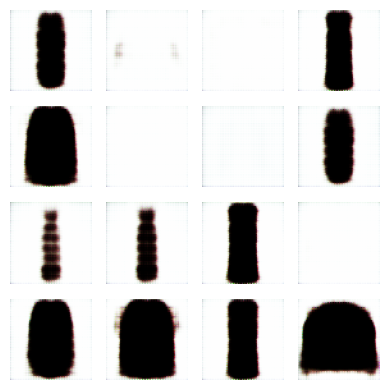

Epoch: 41, Test set ELBO: -6255.17529296875, time elapse for current epoch: 30.406519889831543


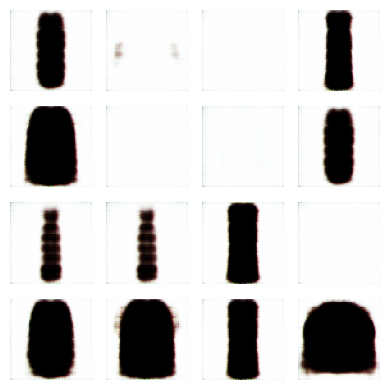

Epoch: 42, Test set ELBO: -6254.96728515625, time elapse for current epoch: 30.30988574028015


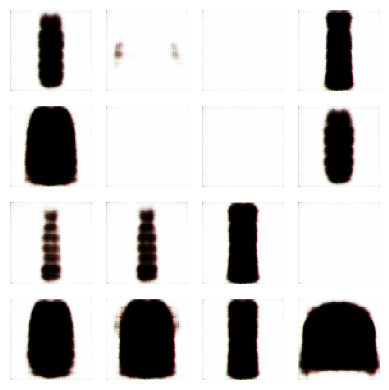

Epoch: 43, Test set ELBO: -6253.05078125, time elapse for current epoch: 40.95536708831787


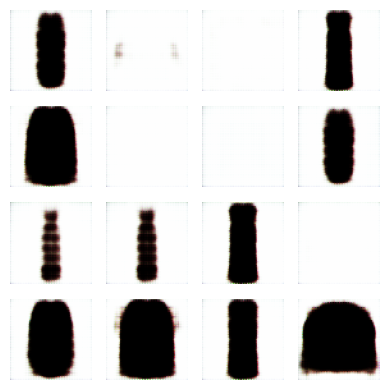

Epoch: 44, Test set ELBO: -6247.40283203125, time elapse for current epoch: 31.085927963256836


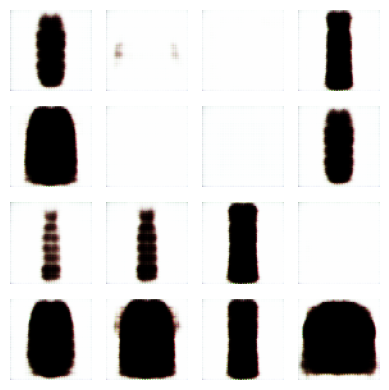

Epoch: 45, Test set ELBO: -6244.953125, time elapse for current epoch: 30.103024005889893


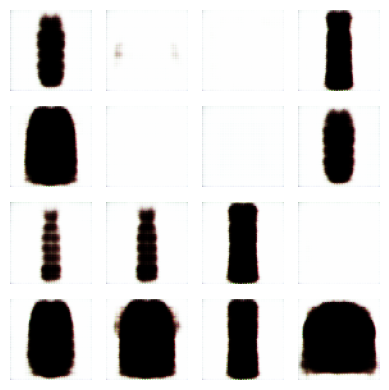

Epoch: 46, Test set ELBO: -6243.8359375, time elapse for current epoch: 30.235642433166504


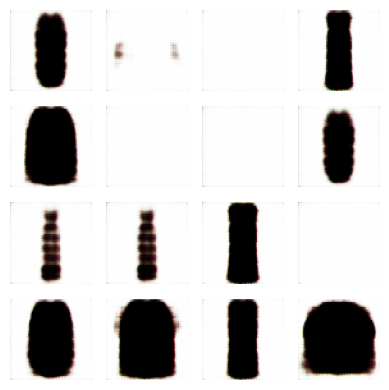

Epoch: 47, Test set ELBO: -6241.91015625, time elapse for current epoch: 30.465890884399414


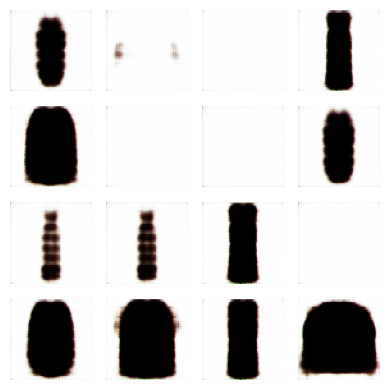

Epoch: 48, Test set ELBO: -6238.73095703125, time elapse for current epoch: 40.54280686378479


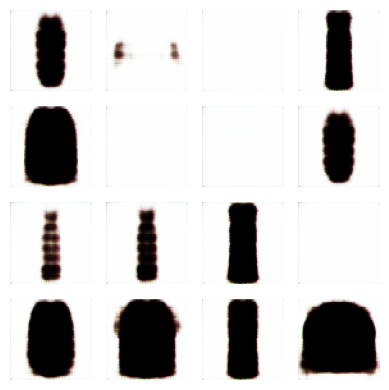

Epoch: 49, Test set ELBO: -6237.96484375, time elapse for current epoch: 40.95496654510498


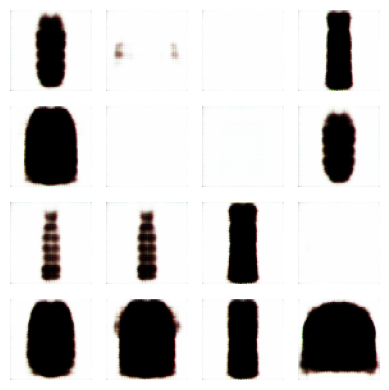

Epoch: 50, Test set ELBO: -6235.69384765625, time elapse for current epoch: 30.38301420211792


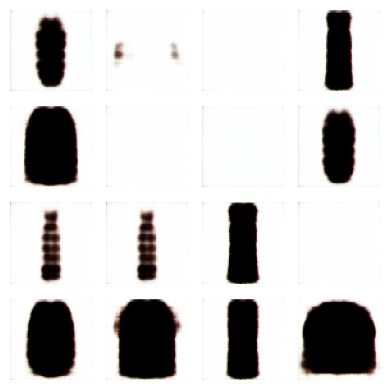

Epoch: 51, Test set ELBO: -6236.14501953125, time elapse for current epoch: 30.536651134490967


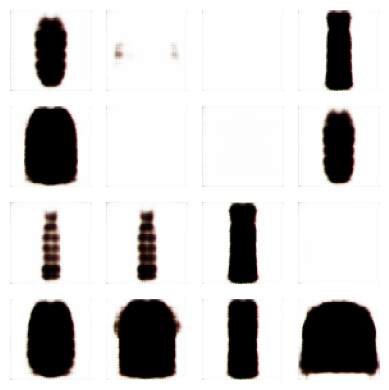

Epoch: 52, Test set ELBO: -6234.93115234375, time elapse for current epoch: 33.49921131134033


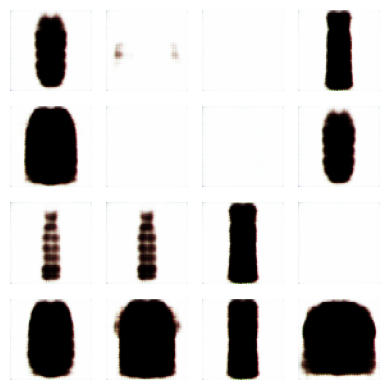

Epoch: 53, Test set ELBO: -6231.22265625, time elapse for current epoch: 30.495875358581543


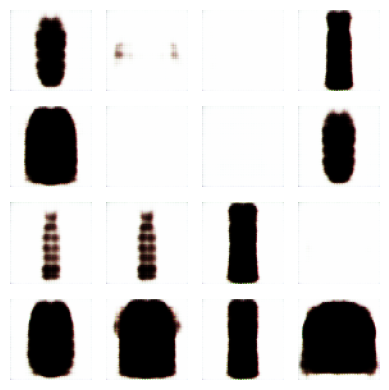

Epoch: 54, Test set ELBO: -6230.20751953125, time elapse for current epoch: 30.399529933929443


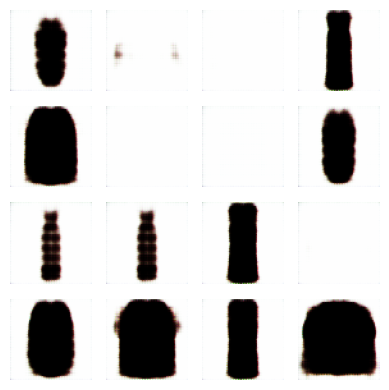

Epoch: 55, Test set ELBO: -6227.24072265625, time elapse for current epoch: 40.945780992507935


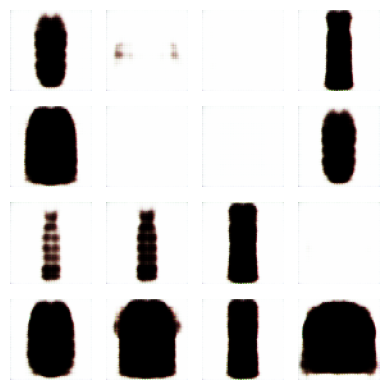

Epoch: 56, Test set ELBO: -6225.39453125, time elapse for current epoch: 32.38228130340576


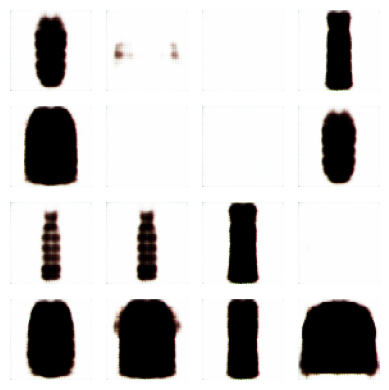

Epoch: 57, Test set ELBO: -6223.578125, time elapse for current epoch: 30.53887677192688


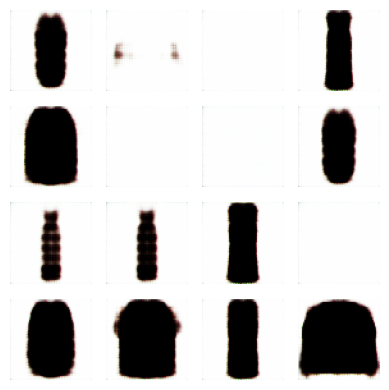

Epoch: 58, Test set ELBO: -6222.552734375, time elapse for current epoch: 30.288474082946777


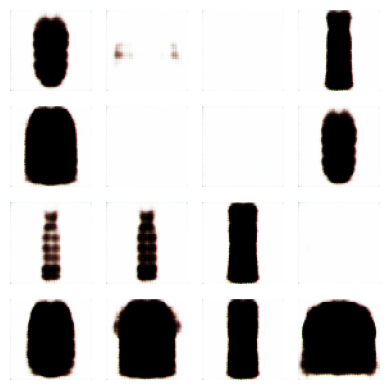

Epoch: 59, Test set ELBO: -6219.908203125, time elapse for current epoch: 30.47019362449646


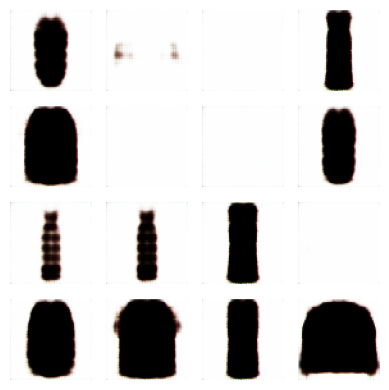

Epoch: 60, Test set ELBO: -6220.91064453125, time elapse for current epoch: 31.01412272453308


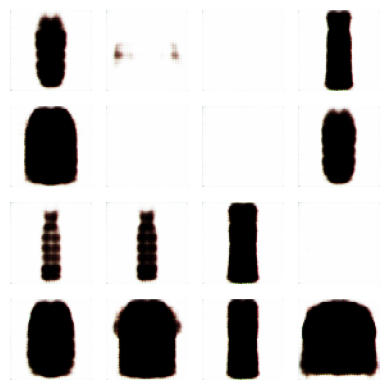

Epoch: 61, Test set ELBO: -6219.93994140625, time elapse for current epoch: 32.40931248664856


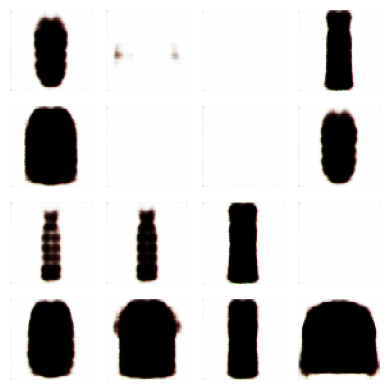

Epoch: 62, Test set ELBO: -6217.56298828125, time elapse for current epoch: 30.22131061553955


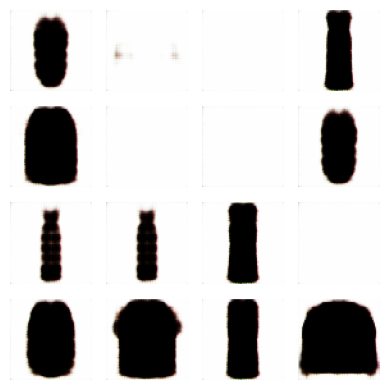

Epoch: 63, Test set ELBO: -6217.21142578125, time elapse for current epoch: 40.94622015953064


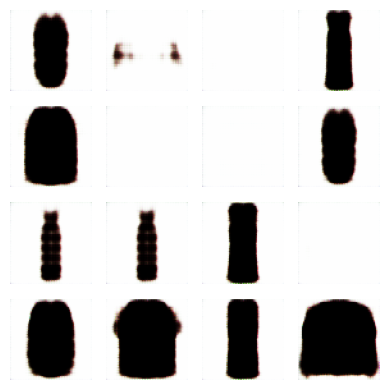

Epoch: 64, Test set ELBO: -6216.66845703125, time elapse for current epoch: 30.249686241149902


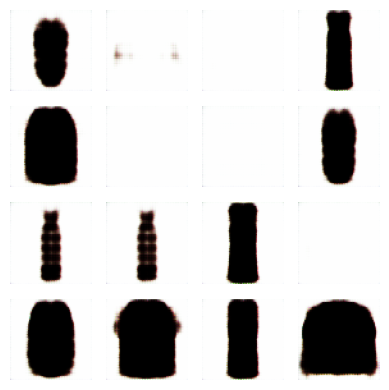

Epoch: 65, Test set ELBO: -6216.63916015625, time elapse for current epoch: 30.690948724746704


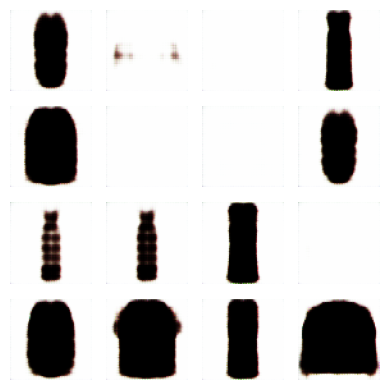

Epoch: 66, Test set ELBO: -6214.37646484375, time elapse for current epoch: 33.60909461975098


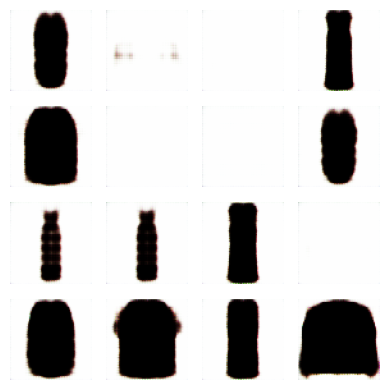

Epoch: 67, Test set ELBO: -6213.41552734375, time elapse for current epoch: 30.71023392677307


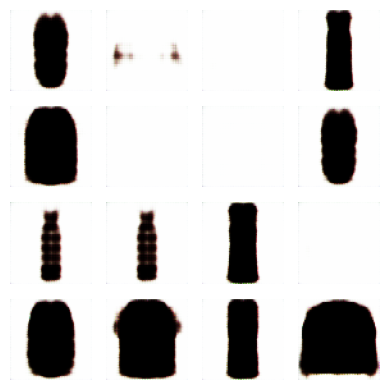

Epoch: 68, Test set ELBO: -6213.6796875, time elapse for current epoch: 30.092702865600586


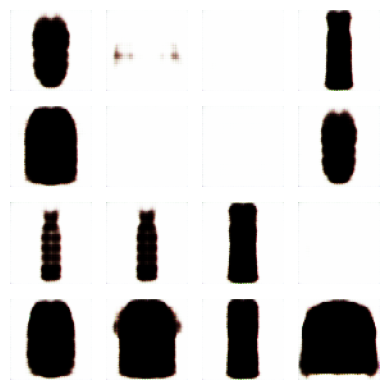

Epoch: 69, Test set ELBO: -6211.08203125, time elapse for current epoch: 30.24471163749695


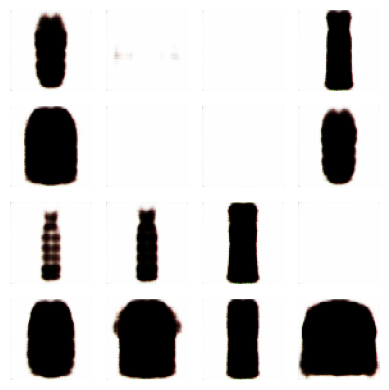

Epoch: 70, Test set ELBO: -6209.0546875, time elapse for current epoch: 32.33245897293091


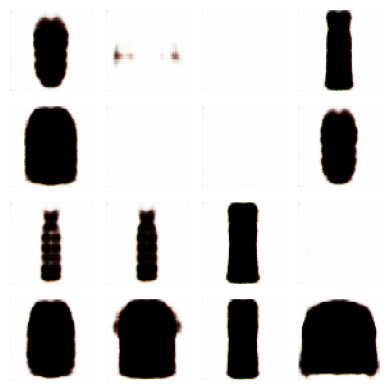

Epoch: 71, Test set ELBO: -6209.77978515625, time elapse for current epoch: 30.70347285270691


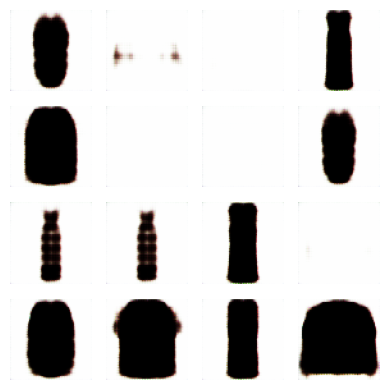

Epoch: 72, Test set ELBO: -6209.32470703125, time elapse for current epoch: 30.362454175949097


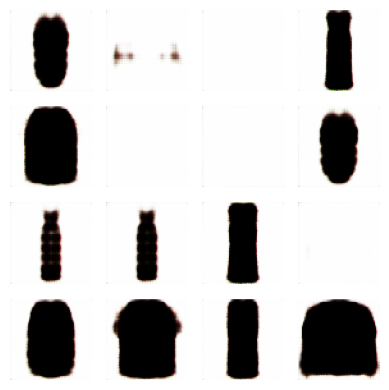

Epoch: 73, Test set ELBO: -6208.74951171875, time elapse for current epoch: 40.94371223449707


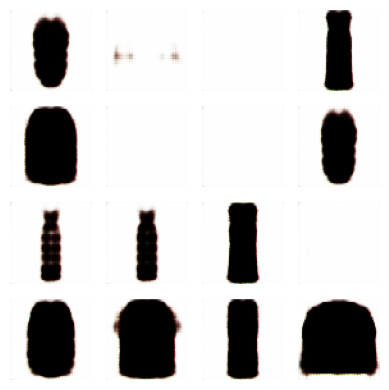

Epoch: 74, Test set ELBO: -6206.7578125, time elapse for current epoch: 30.473707914352417


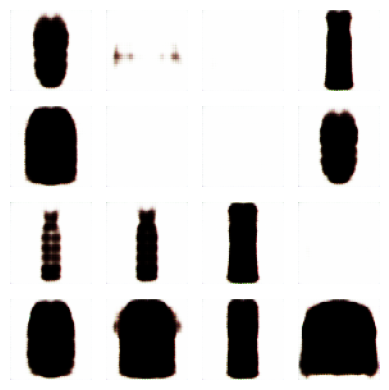

Epoch: 75, Test set ELBO: -6206.61669921875, time elapse for current epoch: 32.24973702430725


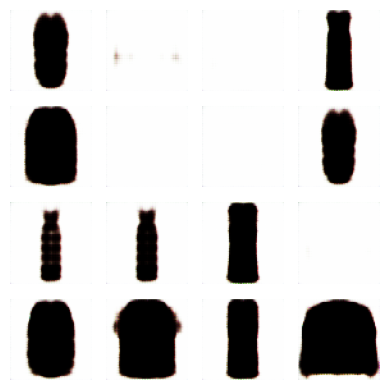

Epoch: 76, Test set ELBO: -6205.45361328125, time elapse for current epoch: 40.944546699523926


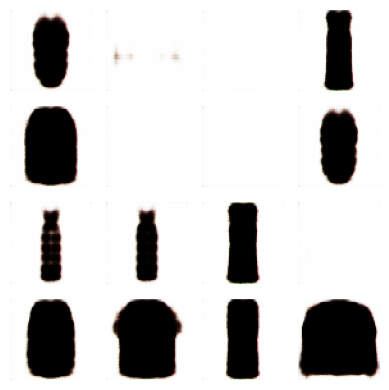

Epoch: 77, Test set ELBO: -6204.27685546875, time elapse for current epoch: 30.365431308746338


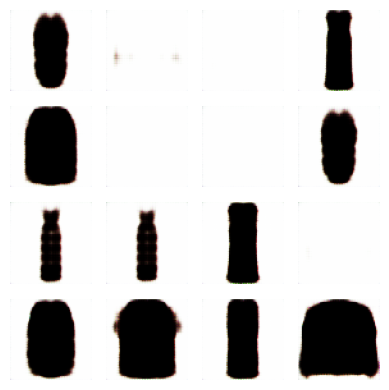

Epoch: 78, Test set ELBO: -6204.02294921875, time elapse for current epoch: 30.398176193237305


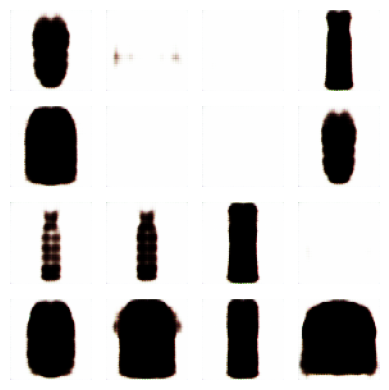

Epoch: 79, Test set ELBO: -6202.90380859375, time elapse for current epoch: 40.95297956466675


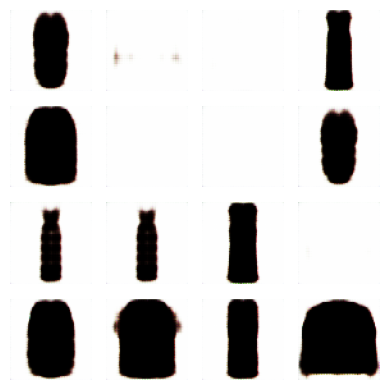

Epoch: 80, Test set ELBO: -6202.37353515625, time elapse for current epoch: 40.9718804359436


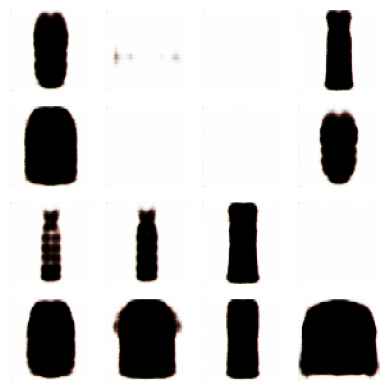

Epoch: 81, Test set ELBO: -6201.06396484375, time elapse for current epoch: 37.910287618637085


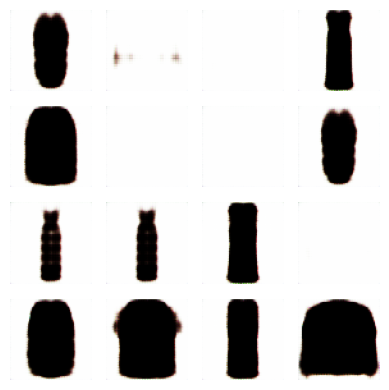

Epoch: 82, Test set ELBO: -6199.97509765625, time elapse for current epoch: 31.349433660507202


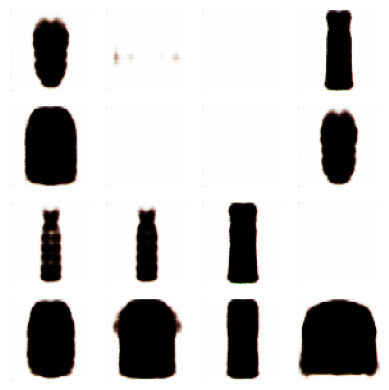

Epoch: 83, Test set ELBO: -6199.642578125, time elapse for current epoch: 31.843843698501587


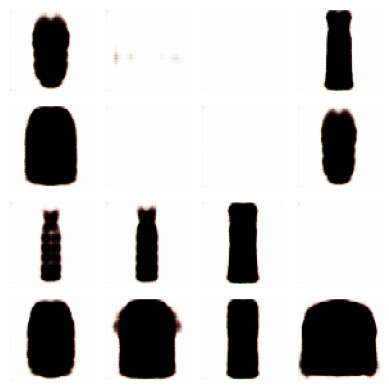

Epoch: 84, Test set ELBO: -6198.79150390625, time elapse for current epoch: 30.287173986434937


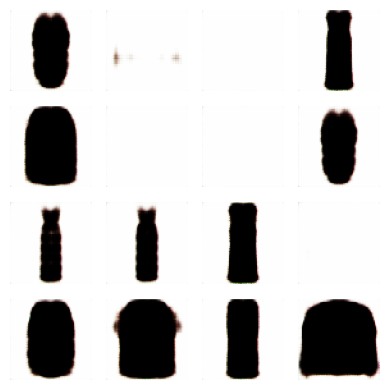

Epoch: 85, Test set ELBO: -6199.14306640625, time elapse for current epoch: 30.267427682876587


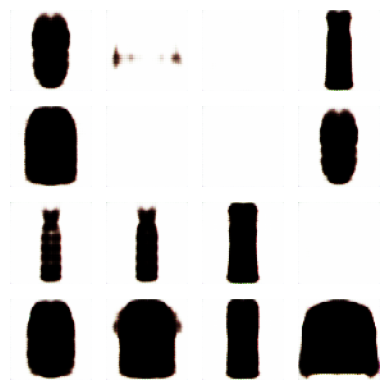

Epoch: 86, Test set ELBO: -6199.05517578125, time elapse for current epoch: 30.305311679840088


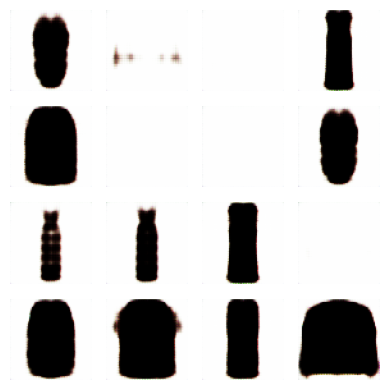

Epoch: 87, Test set ELBO: -6195.76513671875, time elapse for current epoch: 40.94668221473694


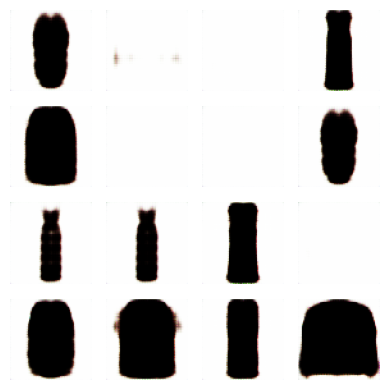

Epoch: 88, Test set ELBO: -6195.76220703125, time elapse for current epoch: 30.399325132369995


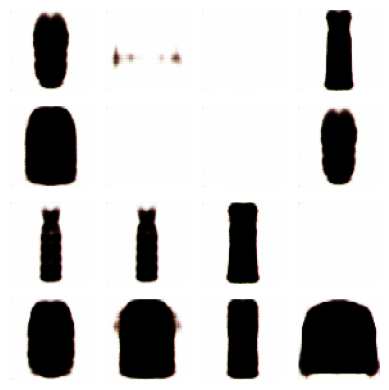

Epoch: 89, Test set ELBO: -6194.88134765625, time elapse for current epoch: 30.300939559936523


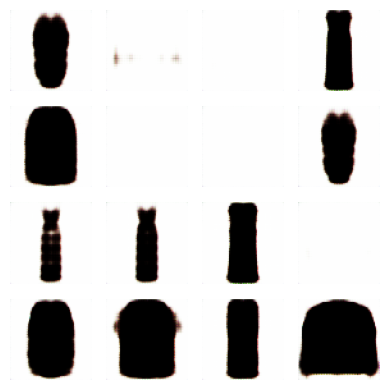

Epoch: 90, Test set ELBO: -6194.28125, time elapse for current epoch: 30.452722787857056


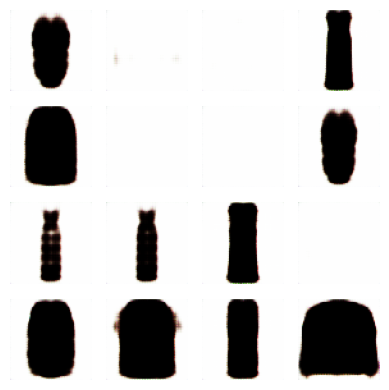

Epoch: 91, Test set ELBO: -6194.74560546875, time elapse for current epoch: 30.224952936172485


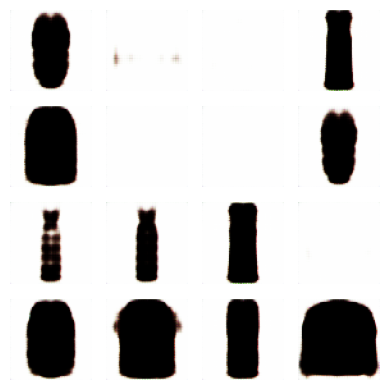

Epoch: 92, Test set ELBO: -6193.06103515625, time elapse for current epoch: 32.302008628845215


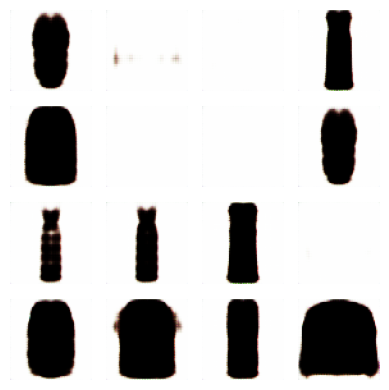

Epoch: 93, Test set ELBO: -6194.96435546875, time elapse for current epoch: 30.537043809890747


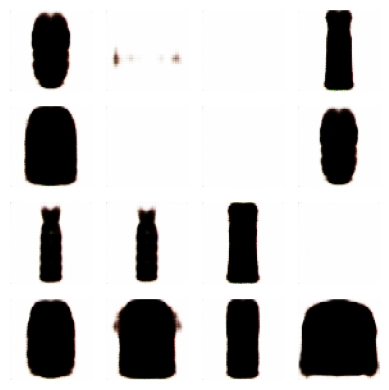

Epoch: 94, Test set ELBO: -6191.41259765625, time elapse for current epoch: 30.447585344314575


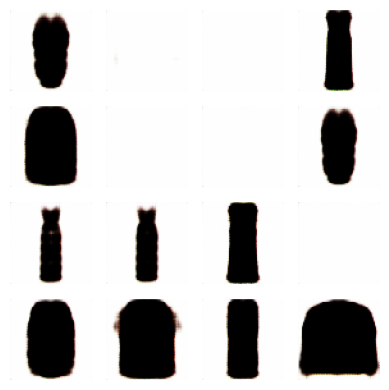

Epoch: 95, Test set ELBO: -6191.34716796875, time elapse for current epoch: 40.95318341255188


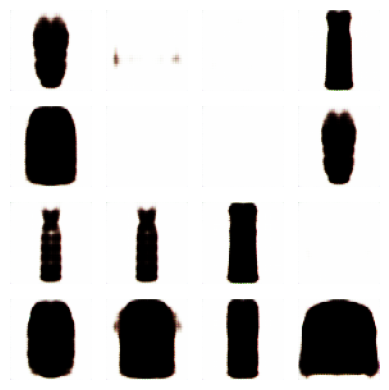

Epoch: 96, Test set ELBO: -6193.77294921875, time elapse for current epoch: 33.13179874420166


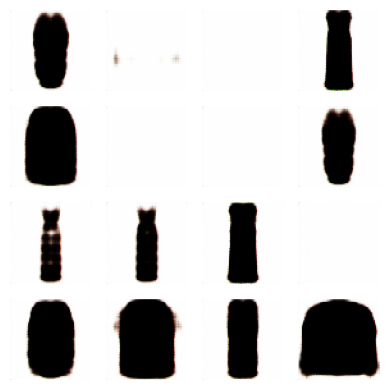

Epoch: 97, Test set ELBO: -6191.68896484375, time elapse for current epoch: 30.56938338279724


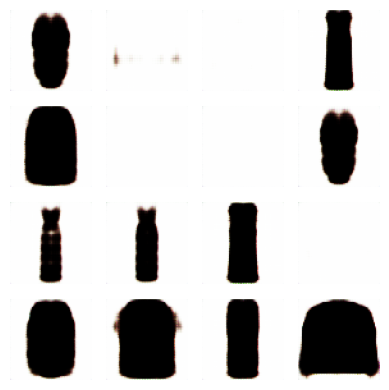

Epoch: 98, Test set ELBO: -6192.17626953125, time elapse for current epoch: 40.157307386398315


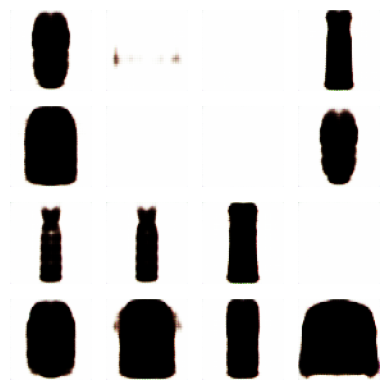

Epoch: 99, Test set ELBO: -6192.82080078125, time elapse for current epoch: 30.428216695785522


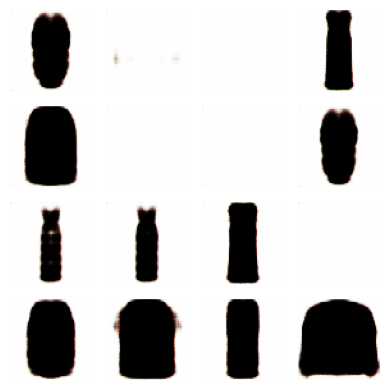

Epoch: 100, Test set ELBO: -6189.177734375, time elapse for current epoch: 40.950993061065674


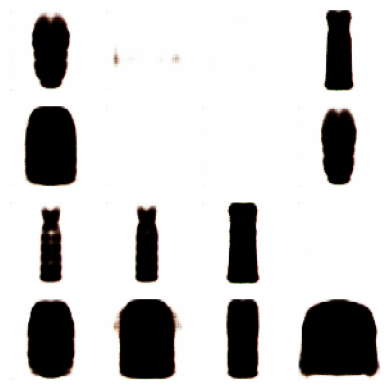

In [ ]:
generate_and_save_images(model, 0, test_sample)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  for train_x in train_dataset:
    train_step(model, train_x, optimizer)
  end_time = time.time()

  loss = tf.keras.metrics.Mean()
  for test_x in val_dataset:
    loss(compute_loss(model, test_x))
  elbo = -loss.result()
  # display.clear_output(wait=False)
  print('Epoch: {}, Test set ELBO: {}, time elapse for current epoch: {}'
        .format(epoch, elbo, end_time - start_time))
  generate_and_save_images(model, epoch, test_sample)

### Display a generated image from the last training epoch

In [ ]:
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

(np.float64(-0.5), np.float64(399.5), np.float64(399.5), np.float64(-0.5))

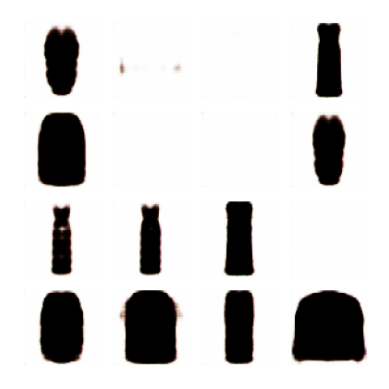

In [ ]:
plt.imshow(display_image(epoch))
plt.axis('off')  # Display images

### Display an animated GIF of all the saved images

In [ ]:
anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

/tmp/ipython-input-15-1290275450.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipython-input-15-1290275450.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



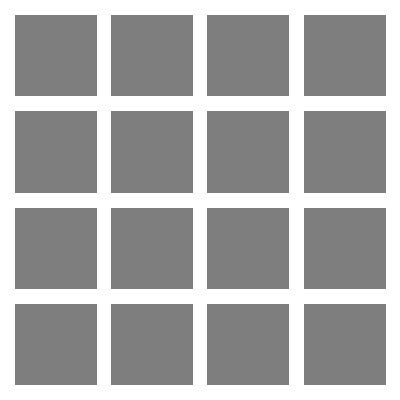

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

### Save images

In [ ]:
import os
import shutil

current_dir = os.getcwd()
png_files = [f for f in os.listdir(current_dir) if f.endswith('.png')]
destination_folder = '/content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_2'
os.makedirs(destination_folder, exist_ok=True)

for file_name in png_files:
    full_file_name = os.path.join(current_dir, file_name)
    shutil.copy(full_file_name, destination_folder)

print(f"Se copiaron {len(png_files)} archivos .png a {destination_folder}")

Se copiaron 101 archivos .png a /content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_2


### Show results throughout the epochs

In [2]:
dir = '/content/drive/MyDrive/Colab Notebooks/tfg/vae/generated_images_vae_model_2'

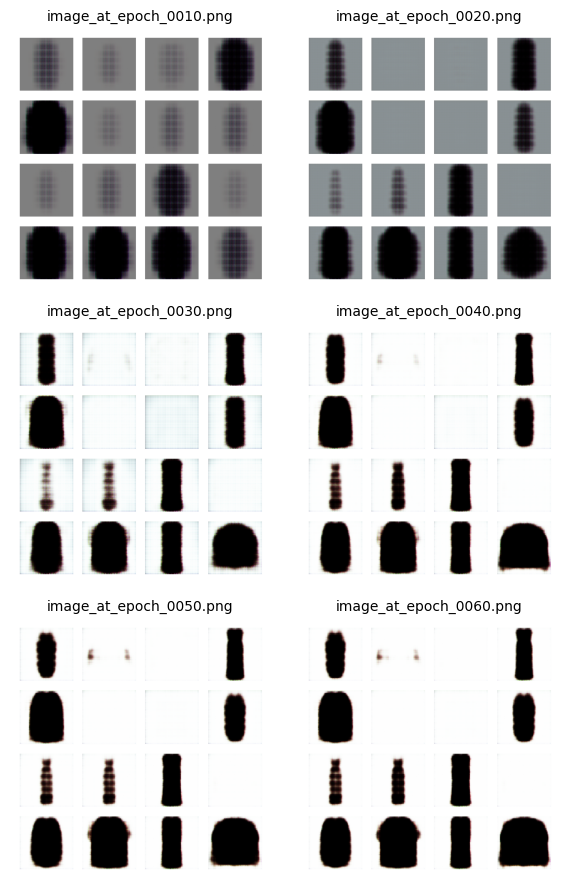

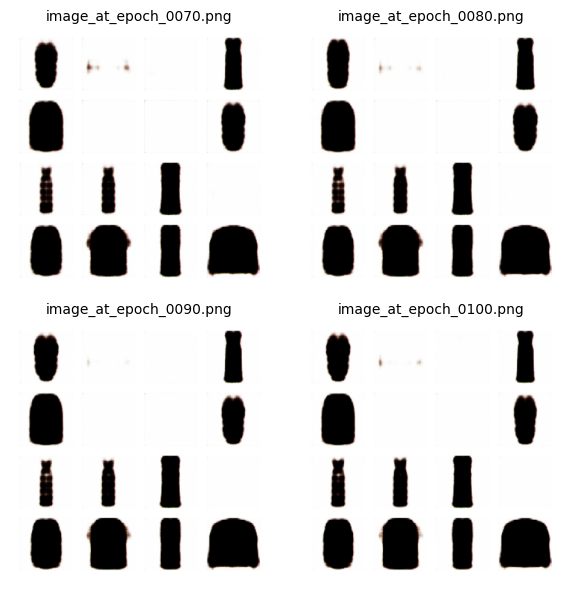

In [3]:
import os
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Extraer número desde el nombre del archivo
def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group()) if match else -1

# Mostrar imágenes en una cuadrícula configurable
def show_images_grid(images, num_rows, num_cols, title=""):
    plt.figure(figsize=(num_cols * 3, num_rows * 3))
    for i, file_name in enumerate(images):
        img = mpimg.imread(file_name)
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(file_name), fontsize=10)
    # plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Directorio de imágenes
modulo = 10  # Cambia esto si solo quieres cada n imagen

# Filtrar y ordenar
png_files = [f for f in os.listdir(dir) if f.endswith('.png')]
png_files = [f for f in png_files if extract_number(f) % modulo == 0]
png_files = sorted(png_files, key=extract_number)

# Cargar rutas completas
png_paths = [os.path.join(dir, f) for f in png_files]

# Mostrar primeras 6 (en cuadrícula 2x3)
show_images_grid(png_paths[1:7], 3, 2)

# Mostrar siguientes 4 (en cuadrícula 2x2)
show_images_grid(png_paths[7:11], 2, 2)

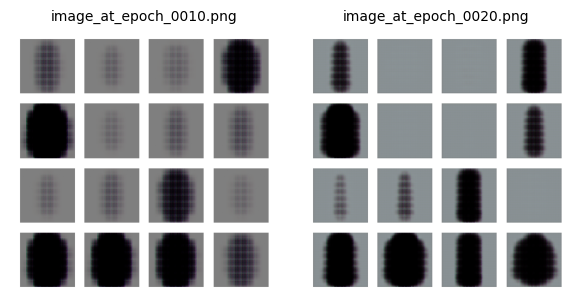

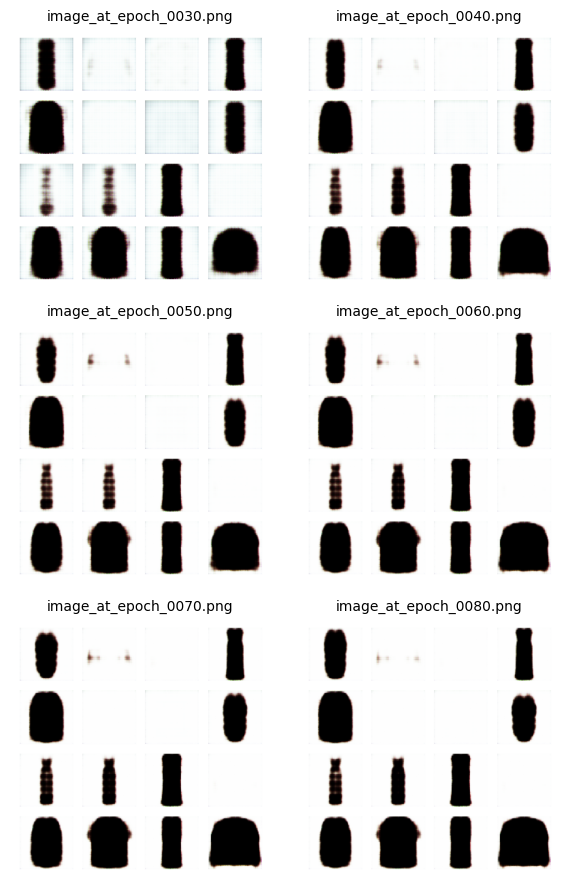

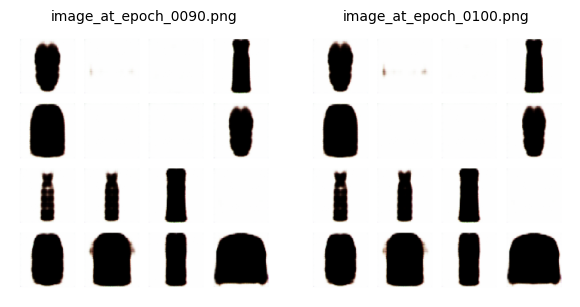

In [4]:
import os
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Extraer número desde el nombre del archivo
def extract_number(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group()) if match else -1

# Mostrar imágenes en una cuadrícula configurable
def show_images_grid(images, num_rows, num_cols, title=""):
    plt.figure(figsize=(num_cols * 3, num_rows * 3))
    for i, file_name in enumerate(images):
        img = mpimg.imread(file_name)
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(file_name), fontsize=10)
    # plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# Directorio de imágenes
modulo = 10  # Cambia esto si solo quieres cada n imagen

# Filtrar y ordenar
png_files = [f for f in os.listdir(dir) if f.endswith('.png')]
png_files = [f for f in png_files if extract_number(f) % modulo == 0]
png_files = sorted(png_files, key=extract_number)

# Cargar rutas completas
png_paths = [os.path.join(dir, f) for f in png_files]

# Mostrar primeras 6 (en cuadrícula 2x3)
show_images_grid(png_paths[1:3], 2, 2)

# Mostrar siguientes 4 (en cuadrícula 2x2)
show_images_grid(png_paths[3:9], 3, 2)

show_images_grid(png_paths[9:11], 2, 2)

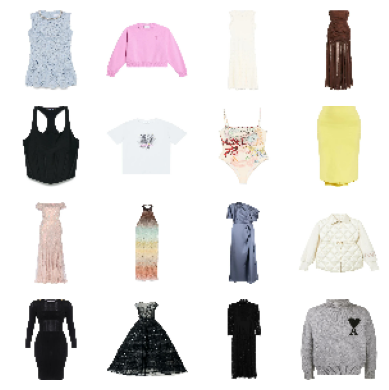

In [ ]:
import matplotlib.pyplot as plt

def display_test_sample(test_sample):
  fig = plt.figure(figsize=(4, 4))
  for i in range(test_sample.shape[0]):
    plt.subplot(4, 4, i + 1)
    # Assuming the images are in the range [-1, 1] due to preprocessing
    # We need to scale them back to [0, 1] for display
    image = (test_sample[i] + 1) / 2
    plt.imshow(image)
    plt.axis('off')
  plt.tight_layout()
  plt.show()

display_test_sample(test_sample)